# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

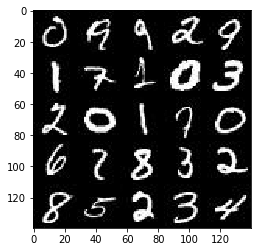

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

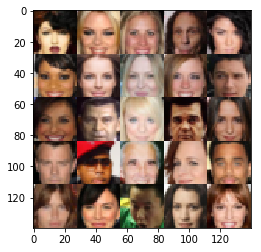

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels))
    input_z = tf.placeholder(tf.float32, (None, z_dim))
    learning_rate = tf.placeholder(tf.float32)
    return input_real, input_z, learning_rate



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator',reuse=reuse):
        x1=tf.layers.conv2d(images,64,5,strides=2,padding='same')
        x1=tf.maximum(alpha*x1,x1)
        #14*14*64
        
        x2=tf.layers.conv2d(x1,128,5,strides=2,padding='same')
        x2=tf.layers.batch_normalization(x2,training=True)
        x2=tf.maximum(alpha*x2,x2)
        #7*7*128
        
        x3=tf.layers.conv2d(x2,256,5,strides=2,padding='same')
        x3=tf.layers.batch_normalization(x3,training=True)
        x3=tf.maximum(alpha*x3,x3)
        #4*4*256
        
        #Flatten it
        flat=tf.reshape(x3,(-1,4*4*256))
        logits=tf.layers.dense(flat,1)
        out=tf.sigmoid(logits)
    

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True,alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse=not is_train
    
    with tf.variable_scope('generator',reuse=reuse):
        x=tf.layers.dense(z,7*7*512)
        x=tf.reshape(x,(-1,7,7,512))
        x1=tf.layers.batch_normalization(x,training=is_train)
        x1=tf.maximum(alpha*x1,x1)
        #7*7*512 
        
        x2=tf.layers.conv2d_transpose(x,256,5,strides=2,padding='same')
        x2=tf.layers.batch_normalization(x2,training=is_train)
        x2=tf.maximum(alpha*x2,x2)
        #14*14*256
        
        x3=tf.layers.conv2d_transpose(x2,128,5,strides=2,padding='same')
        x3=tf.layers.batch_normalization(x3,training=is_train)
        x3=tf.maximum(alpha*x3,x3)
        #28*28*128
        
        logits=tf.layers.conv2d_transpose(x3,out_channel_dim,5,strides=1,padding='same')
        out=tf.tanh(logits)
        
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """ 
    # TODO: Implement Function
    smooth = 0.1
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    g_model = generator(input_z, out_channel_dim, is_train=True)    
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)* (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
        
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(g_update_ops):    
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    
    #saver=tf.train.Saver()
    #sample_z=np.random.uniform(-1,1,size=(72,z_dim))
    input_real, input_z, input_learning_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,  data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, input_learning_rate:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_learning_rate:learning_rate})
                
                if steps % 20 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}... steps:{} ".format(epoch_i+1, epochs, steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
        print("final Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
        show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
    

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2... steps:20  Discriminator Loss: 1.9080... Generator Loss: 5.4003
Epoch 1/2... steps:40  Discriminator Loss: 0.7305... Generator Loss: 2.0136
Epoch 1/2... steps:60  Discriminator Loss: 2.0289... Generator Loss: 0.2888
Epoch 1/2... steps:80  Discriminator Loss: 1.1142... Generator Loss: 1.0461
Epoch 1/2... steps:100  Discriminator Loss: 0.8666... Generator Loss: 1.2474


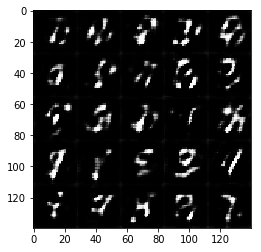

Epoch 1/2... steps:120  Discriminator Loss: 0.8902... Generator Loss: 1.1704
Epoch 1/2... steps:140  Discriminator Loss: 1.3770... Generator Loss: 2.1120
Epoch 1/2... steps:160  Discriminator Loss: 1.0913... Generator Loss: 0.9380
Epoch 1/2... steps:180  Discriminator Loss: 1.4209... Generator Loss: 0.6881
Epoch 1/2... steps:200  Discriminator Loss: 1.0917... Generator Loss: 1.2591


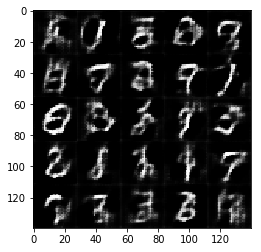

Epoch 1/2... steps:220  Discriminator Loss: 1.1635... Generator Loss: 1.1517
Epoch 1/2... steps:240  Discriminator Loss: 1.1588... Generator Loss: 0.9662
Epoch 1/2... steps:260  Discriminator Loss: 1.1750... Generator Loss: 1.4025
Epoch 1/2... steps:280  Discriminator Loss: 1.2686... Generator Loss: 0.6872
Epoch 1/2... steps:300  Discriminator Loss: 1.1260... Generator Loss: 1.0827


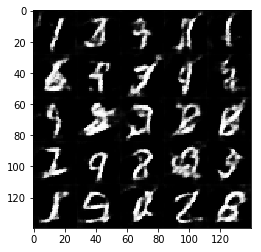

Epoch 1/2... steps:320  Discriminator Loss: 1.0766... Generator Loss: 1.0481
Epoch 1/2... steps:340  Discriminator Loss: 1.1925... Generator Loss: 0.8066
Epoch 1/2... steps:360  Discriminator Loss: 1.1948... Generator Loss: 1.5110
Epoch 1/2... steps:380  Discriminator Loss: 1.7011... Generator Loss: 0.4122
Epoch 1/2... steps:400  Discriminator Loss: 1.4814... Generator Loss: 2.3864


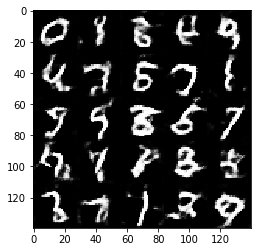

Epoch 1/2... steps:420  Discriminator Loss: 1.2897... Generator Loss: 0.6518
Epoch 1/2... steps:440  Discriminator Loss: 1.1776... Generator Loss: 1.4896
Epoch 1/2... steps:460  Discriminator Loss: 1.0965... Generator Loss: 1.3283
Epoch 2/2... steps:480  Discriminator Loss: 1.1473... Generator Loss: 0.9060
Epoch 2/2... steps:500  Discriminator Loss: 1.6155... Generator Loss: 1.9909


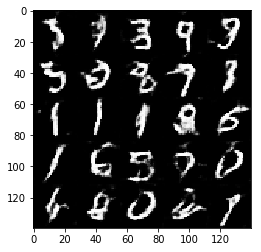

Epoch 2/2... steps:520  Discriminator Loss: 1.1592... Generator Loss: 0.7898
Epoch 2/2... steps:540  Discriminator Loss: 3.2347... Generator Loss: 4.1120
Epoch 2/2... steps:560  Discriminator Loss: 1.1677... Generator Loss: 1.1365
Epoch 2/2... steps:580  Discriminator Loss: 1.2858... Generator Loss: 0.6749
Epoch 2/2... steps:600  Discriminator Loss: 1.1715... Generator Loss: 1.4510


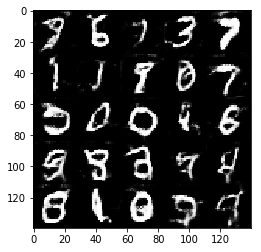

Epoch 2/2... steps:620  Discriminator Loss: 1.0957... Generator Loss: 0.9499
Epoch 2/2... steps:640  Discriminator Loss: 0.9652... Generator Loss: 1.2962
Epoch 2/2... steps:660  Discriminator Loss: 1.4695... Generator Loss: 0.5160
Epoch 2/2... steps:680  Discriminator Loss: 1.1645... Generator Loss: 0.9226
Epoch 2/2... steps:700  Discriminator Loss: 1.1142... Generator Loss: 0.7818


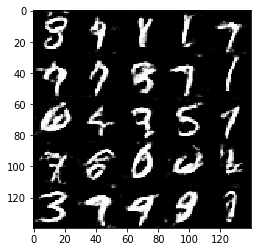

Epoch 2/2... steps:720  Discriminator Loss: 1.0149... Generator Loss: 1.0041
Epoch 2/2... steps:740  Discriminator Loss: 1.0358... Generator Loss: 1.0636
Epoch 2/2... steps:760  Discriminator Loss: 1.0802... Generator Loss: 1.1237
Epoch 2/2... steps:780  Discriminator Loss: 1.3979... Generator Loss: 2.1012
Epoch 2/2... steps:800  Discriminator Loss: 1.1885... Generator Loss: 1.7305


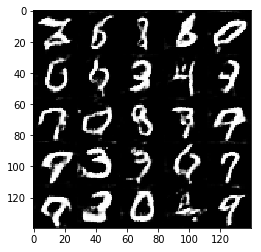

Epoch 2/2... steps:820  Discriminator Loss: 0.7734... Generator Loss: 1.7135
Epoch 2/2... steps:840  Discriminator Loss: 1.1312... Generator Loss: 0.7104
Epoch 2/2... steps:860  Discriminator Loss: 1.7059... Generator Loss: 0.4102
Epoch 2/2... steps:880  Discriminator Loss: 1.2014... Generator Loss: 0.7091
Epoch 2/2... steps:900  Discriminator Loss: 0.8166... Generator Loss: 1.4939


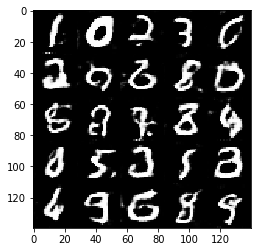

Epoch 2/2... steps:920  Discriminator Loss: 0.9528... Generator Loss: 1.1143
final Discriminator Loss: 0.9528... Generator Loss: 1.1143


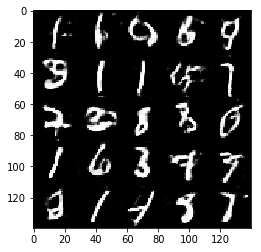

In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/8... steps:20  Discriminator Loss: 2.6652... Generator Loss: 0.2539
Epoch 1/8... steps:40  Discriminator Loss: 0.9305... Generator Loss: 1.1917
Epoch 1/8... steps:60  Discriminator Loss: 1.1236... Generator Loss: 0.9220
Epoch 1/8... steps:80  Discriminator Loss: 0.8965... Generator Loss: 1.6103
Epoch 1/8... steps:100  Discriminator Loss: 1.1521... Generator Loss: 1.2021


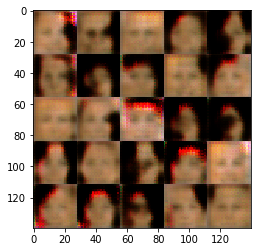

Epoch 1/8... steps:120  Discriminator Loss: 1.5415... Generator Loss: 0.7762
Epoch 1/8... steps:140  Discriminator Loss: 1.2255... Generator Loss: 0.8899
Epoch 1/8... steps:160  Discriminator Loss: 1.0739... Generator Loss: 1.0311
Epoch 1/8... steps:180  Discriminator Loss: 1.0461... Generator Loss: 1.0832
Epoch 1/8... steps:200  Discriminator Loss: 1.3301... Generator Loss: 0.8989


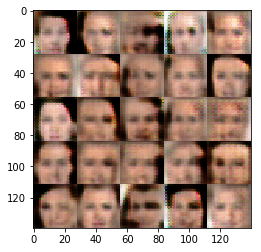

Epoch 1/8... steps:220  Discriminator Loss: 1.3963... Generator Loss: 0.8493
Epoch 1/8... steps:240  Discriminator Loss: 1.0243... Generator Loss: 1.1471
Epoch 1/8... steps:260  Discriminator Loss: 0.8004... Generator Loss: 1.4186
Epoch 1/8... steps:280  Discriminator Loss: 1.1769... Generator Loss: 0.8599
Epoch 1/8... steps:300  Discriminator Loss: 0.8547... Generator Loss: 1.7659


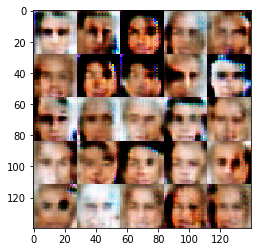

Epoch 1/8... steps:320  Discriminator Loss: 1.1350... Generator Loss: 0.8014
Epoch 1/8... steps:340  Discriminator Loss: 1.1812... Generator Loss: 1.0881
Epoch 1/8... steps:360  Discriminator Loss: 1.2574... Generator Loss: 1.0382
Epoch 1/8... steps:380  Discriminator Loss: 1.2140... Generator Loss: 1.1262
Epoch 1/8... steps:400  Discriminator Loss: 1.3004... Generator Loss: 0.8439


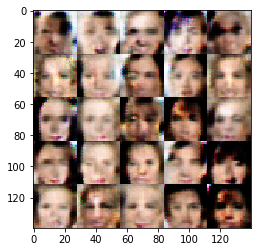

Epoch 1/8... steps:420  Discriminator Loss: 1.3296... Generator Loss: 1.5897
Epoch 1/8... steps:440  Discriminator Loss: 1.4116... Generator Loss: 0.8568
Epoch 1/8... steps:460  Discriminator Loss: 1.3102... Generator Loss: 0.7875
Epoch 1/8... steps:480  Discriminator Loss: 1.1618... Generator Loss: 1.5174
Epoch 1/8... steps:500  Discriminator Loss: 1.1317... Generator Loss: 1.2146


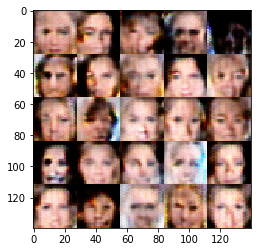

Epoch 1/8... steps:520  Discriminator Loss: 1.1671... Generator Loss: 1.5635
Epoch 1/8... steps:540  Discriminator Loss: 0.8409... Generator Loss: 1.4409
Epoch 1/8... steps:560  Discriminator Loss: 1.4177... Generator Loss: 0.5090
Epoch 1/8... steps:580  Discriminator Loss: 1.2396... Generator Loss: 1.1418
Epoch 1/8... steps:600  Discriminator Loss: 2.6801... Generator Loss: 3.1564


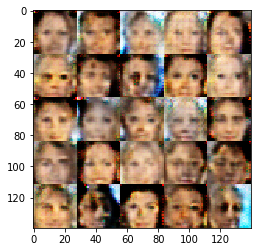

Epoch 1/8... steps:620  Discriminator Loss: 1.5375... Generator Loss: 0.4906
Epoch 1/8... steps:640  Discriminator Loss: 1.2234... Generator Loss: 1.6742
Epoch 1/8... steps:660  Discriminator Loss: 1.2945... Generator Loss: 1.0849
Epoch 1/8... steps:680  Discriminator Loss: 1.0760... Generator Loss: 1.2194
Epoch 1/8... steps:700  Discriminator Loss: 1.7290... Generator Loss: 0.5467


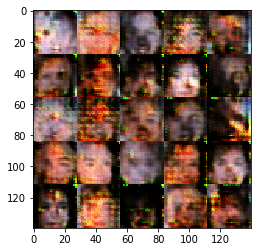

Epoch 1/8... steps:720  Discriminator Loss: 1.3486... Generator Loss: 0.8303
Epoch 1/8... steps:740  Discriminator Loss: 1.0332... Generator Loss: 1.0784
Epoch 1/8... steps:760  Discriminator Loss: 0.8667... Generator Loss: 1.4693
Epoch 1/8... steps:780  Discriminator Loss: 1.1435... Generator Loss: 1.3462
Epoch 1/8... steps:800  Discriminator Loss: 1.1933... Generator Loss: 1.0893


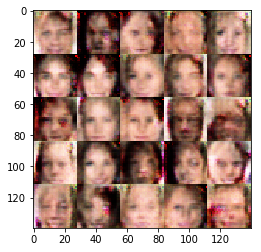

Epoch 1/8... steps:820  Discriminator Loss: 1.0358... Generator Loss: 0.9155
Epoch 1/8... steps:840  Discriminator Loss: 1.2940... Generator Loss: 0.8374
Epoch 1/8... steps:860  Discriminator Loss: 1.3218... Generator Loss: 0.9357
Epoch 1/8... steps:880  Discriminator Loss: 1.1812... Generator Loss: 0.8964
Epoch 1/8... steps:900  Discriminator Loss: 1.3971... Generator Loss: 1.7455


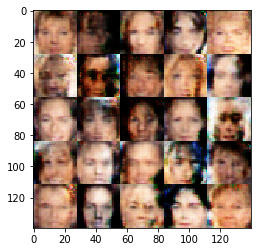

Epoch 1/8... steps:920  Discriminator Loss: 1.1275... Generator Loss: 0.7532
Epoch 1/8... steps:940  Discriminator Loss: 1.0946... Generator Loss: 1.1686
Epoch 1/8... steps:960  Discriminator Loss: 2.5970... Generator Loss: 0.1352
Epoch 1/8... steps:980  Discriminator Loss: 1.2844... Generator Loss: 0.8898
Epoch 1/8... steps:1000  Discriminator Loss: 1.1639... Generator Loss: 1.1214


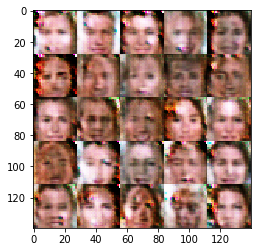

Epoch 1/8... steps:1020  Discriminator Loss: 1.2892... Generator Loss: 0.9545
Epoch 1/8... steps:1040  Discriminator Loss: 1.2085... Generator Loss: 1.2568
Epoch 1/8... steps:1060  Discriminator Loss: 1.0926... Generator Loss: 0.9493
Epoch 1/8... steps:1080  Discriminator Loss: 1.1367... Generator Loss: 1.2548
Epoch 1/8... steps:1100  Discriminator Loss: 1.3529... Generator Loss: 0.6710


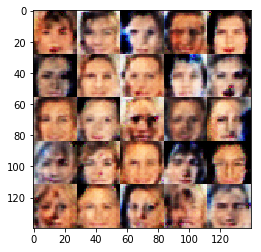

Epoch 1/8... steps:1120  Discriminator Loss: 1.1044... Generator Loss: 0.9102
Epoch 1/8... steps:1140  Discriminator Loss: 1.2328... Generator Loss: 0.6679
Epoch 1/8... steps:1160  Discriminator Loss: 1.3294... Generator Loss: 0.8763
Epoch 1/8... steps:1180  Discriminator Loss: 0.8516... Generator Loss: 1.3561
Epoch 1/8... steps:1200  Discriminator Loss: 1.4955... Generator Loss: 1.4915


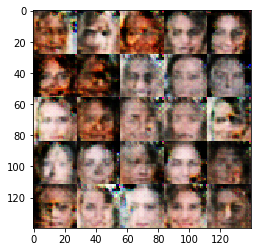

Epoch 1/8... steps:1220  Discriminator Loss: 1.2353... Generator Loss: 0.7432
Epoch 1/8... steps:1240  Discriminator Loss: 0.8698... Generator Loss: 1.4789
Epoch 1/8... steps:1260  Discriminator Loss: 1.2765... Generator Loss: 0.9584
Epoch 1/8... steps:1280  Discriminator Loss: 1.2916... Generator Loss: 0.6287
Epoch 1/8... steps:1300  Discriminator Loss: 1.4859... Generator Loss: 0.4820


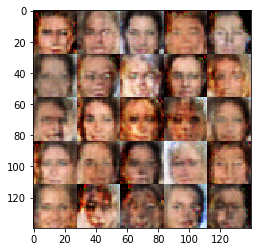

Epoch 1/8... steps:1320  Discriminator Loss: 1.2961... Generator Loss: 0.9663
Epoch 1/8... steps:1340  Discriminator Loss: 1.1379... Generator Loss: 1.1012
Epoch 1/8... steps:1360  Discriminator Loss: 1.4940... Generator Loss: 0.4910
Epoch 1/8... steps:1380  Discriminator Loss: 1.3280... Generator Loss: 0.9006
Epoch 1/8... steps:1400  Discriminator Loss: 0.7597... Generator Loss: 1.2884


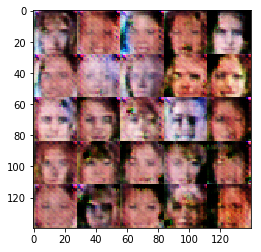

Epoch 1/8... steps:1420  Discriminator Loss: 1.4884... Generator Loss: 0.7047
Epoch 1/8... steps:1440  Discriminator Loss: 1.0680... Generator Loss: 1.7367
Epoch 1/8... steps:1460  Discriminator Loss: 1.2888... Generator Loss: 0.9036
Epoch 1/8... steps:1480  Discriminator Loss: 1.2443... Generator Loss: 0.5975
Epoch 1/8... steps:1500  Discriminator Loss: 1.3080... Generator Loss: 0.7719


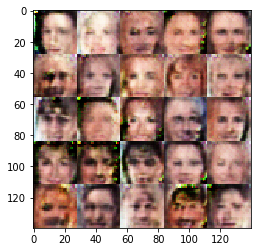

Epoch 1/8... steps:1520  Discriminator Loss: 1.2722... Generator Loss: 0.7729
Epoch 1/8... steps:1540  Discriminator Loss: 1.2122... Generator Loss: 0.8542
Epoch 1/8... steps:1560  Discriminator Loss: 1.3538... Generator Loss: 0.8587
Epoch 1/8... steps:1580  Discriminator Loss: 1.1553... Generator Loss: 0.7913
Epoch 2/8... steps:1600  Discriminator Loss: 1.3014... Generator Loss: 0.9525


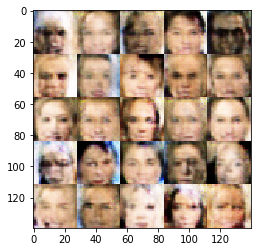

Epoch 2/8... steps:1620  Discriminator Loss: 1.2871... Generator Loss: 0.6560
Epoch 2/8... steps:1640  Discriminator Loss: 1.4576... Generator Loss: 0.6508
Epoch 2/8... steps:1660  Discriminator Loss: 1.4775... Generator Loss: 0.4917
Epoch 2/8... steps:1680  Discriminator Loss: 1.6546... Generator Loss: 0.4067
Epoch 2/8... steps:1700  Discriminator Loss: 1.7368... Generator Loss: 1.6880


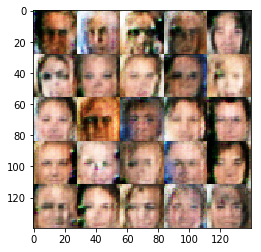

Epoch 2/8... steps:1720  Discriminator Loss: 1.3968... Generator Loss: 1.3191
Epoch 2/8... steps:1740  Discriminator Loss: 1.3920... Generator Loss: 0.8618
Epoch 2/8... steps:1760  Discriminator Loss: 1.4509... Generator Loss: 1.0003
Epoch 2/8... steps:1780  Discriminator Loss: 1.3639... Generator Loss: 1.3678
Epoch 2/8... steps:1800  Discriminator Loss: 1.3642... Generator Loss: 0.8122


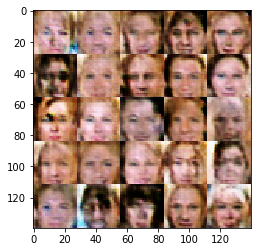

Epoch 2/8... steps:1820  Discriminator Loss: 1.3779... Generator Loss: 0.8361
Epoch 2/8... steps:1840  Discriminator Loss: 1.4893... Generator Loss: 0.9176
Epoch 2/8... steps:1860  Discriminator Loss: 1.3323... Generator Loss: 0.9086
Epoch 2/8... steps:1880  Discriminator Loss: 1.3194... Generator Loss: 0.7742
Epoch 2/8... steps:1900  Discriminator Loss: 1.3855... Generator Loss: 0.7338


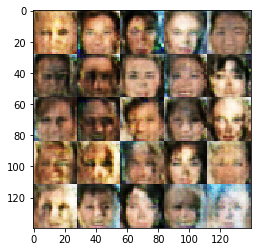

Epoch 2/8... steps:1920  Discriminator Loss: 1.4898... Generator Loss: 0.9133
Epoch 2/8... steps:1940  Discriminator Loss: 1.4974... Generator Loss: 0.9293
Epoch 2/8... steps:1960  Discriminator Loss: 1.3752... Generator Loss: 1.0532
Epoch 2/8... steps:1980  Discriminator Loss: 1.4022... Generator Loss: 0.8034
Epoch 2/8... steps:2000  Discriminator Loss: 1.3086... Generator Loss: 0.9179


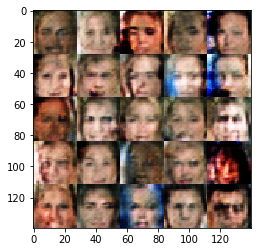

Epoch 2/8... steps:2020  Discriminator Loss: 1.4699... Generator Loss: 0.6113
Epoch 2/8... steps:2040  Discriminator Loss: 1.4226... Generator Loss: 1.0381
Epoch 2/8... steps:2060  Discriminator Loss: 1.3480... Generator Loss: 0.8488
Epoch 2/8... steps:2080  Discriminator Loss: 1.2998... Generator Loss: 1.0947
Epoch 2/8... steps:2100  Discriminator Loss: 1.3046... Generator Loss: 0.8190


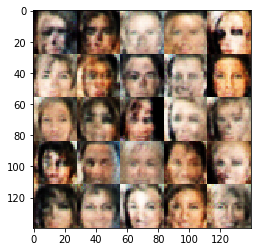

Epoch 2/8... steps:2120  Discriminator Loss: 1.3290... Generator Loss: 0.8731
Epoch 2/8... steps:2140  Discriminator Loss: 1.3267... Generator Loss: 0.9160
Epoch 2/8... steps:2160  Discriminator Loss: 1.3990... Generator Loss: 0.7445
Epoch 2/8... steps:2180  Discriminator Loss: 1.3398... Generator Loss: 0.8319
Epoch 2/8... steps:2200  Discriminator Loss: 1.3556... Generator Loss: 0.6384


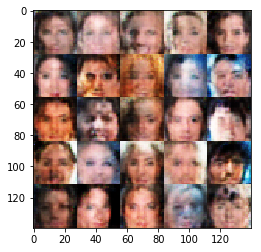

Epoch 2/8... steps:2220  Discriminator Loss: 1.3883... Generator Loss: 0.6673
Epoch 2/8... steps:2240  Discriminator Loss: 1.3669... Generator Loss: 0.9032
Epoch 2/8... steps:2260  Discriminator Loss: 1.3362... Generator Loss: 0.8833
Epoch 2/8... steps:2280  Discriminator Loss: 1.2850... Generator Loss: 0.7929
Epoch 2/8... steps:2300  Discriminator Loss: 1.2470... Generator Loss: 0.9677


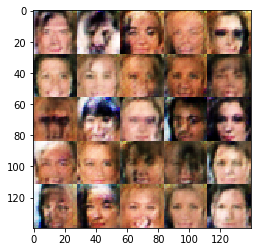

Epoch 2/8... steps:2320  Discriminator Loss: 1.1940... Generator Loss: 1.0017
Epoch 2/8... steps:2340  Discriminator Loss: 1.3922... Generator Loss: 0.7675
Epoch 2/8... steps:2360  Discriminator Loss: 1.3839... Generator Loss: 0.8191
Epoch 2/8... steps:2380  Discriminator Loss: 1.3410... Generator Loss: 0.7683
Epoch 2/8... steps:2400  Discriminator Loss: 1.5154... Generator Loss: 1.2030


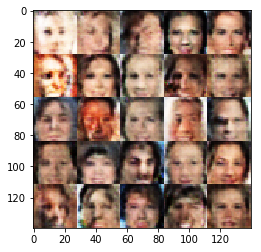

Epoch 2/8... steps:2420  Discriminator Loss: 1.2927... Generator Loss: 0.9345
Epoch 2/8... steps:2440  Discriminator Loss: 1.3973... Generator Loss: 1.3091
Epoch 2/8... steps:2460  Discriminator Loss: 1.3024... Generator Loss: 0.9340
Epoch 2/8... steps:2480  Discriminator Loss: 1.2971... Generator Loss: 0.8855
Epoch 2/8... steps:2500  Discriminator Loss: 1.3210... Generator Loss: 0.8246


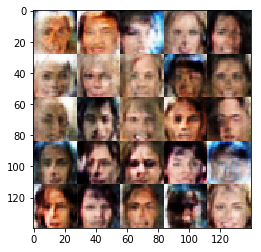

Epoch 2/8... steps:2520  Discriminator Loss: 1.2823... Generator Loss: 0.8628
Epoch 2/8... steps:2540  Discriminator Loss: 1.3637... Generator Loss: 0.9577
Epoch 2/8... steps:2560  Discriminator Loss: 1.2214... Generator Loss: 0.8196
Epoch 2/8... steps:2580  Discriminator Loss: 1.5524... Generator Loss: 1.3031
Epoch 2/8... steps:2600  Discriminator Loss: 1.3546... Generator Loss: 0.9421


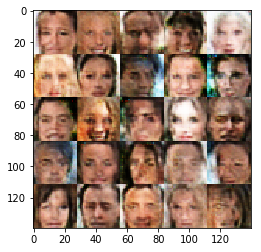

Epoch 2/8... steps:2620  Discriminator Loss: 1.3476... Generator Loss: 1.0051
Epoch 2/8... steps:2640  Discriminator Loss: 1.3419... Generator Loss: 0.9790
Epoch 2/8... steps:2660  Discriminator Loss: 1.2973... Generator Loss: 0.7629
Epoch 2/8... steps:2680  Discriminator Loss: 1.3129... Generator Loss: 0.8210
Epoch 2/8... steps:2700  Discriminator Loss: 1.3600... Generator Loss: 0.6759


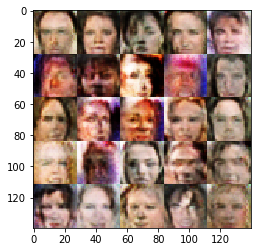

Epoch 2/8... steps:2720  Discriminator Loss: 1.2850... Generator Loss: 0.8638
Epoch 2/8... steps:2740  Discriminator Loss: 1.2435... Generator Loss: 0.8118
Epoch 2/8... steps:2760  Discriminator Loss: 1.6333... Generator Loss: 0.4323
Epoch 2/8... steps:2780  Discriminator Loss: 1.2789... Generator Loss: 0.7558
Epoch 2/8... steps:2800  Discriminator Loss: 1.2699... Generator Loss: 0.9322


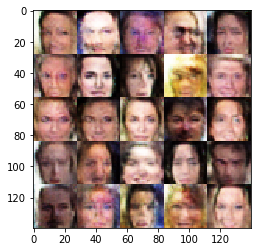

Epoch 2/8... steps:2820  Discriminator Loss: 1.2682... Generator Loss: 0.7895
Epoch 2/8... steps:2840  Discriminator Loss: 1.2106... Generator Loss: 0.9470
Epoch 2/8... steps:2860  Discriminator Loss: 1.2898... Generator Loss: 0.8352
Epoch 2/8... steps:2880  Discriminator Loss: 0.8200... Generator Loss: 1.4010
Epoch 2/8... steps:2900  Discriminator Loss: 1.3214... Generator Loss: 0.6904


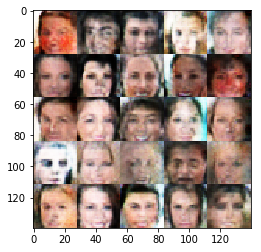

Epoch 2/8... steps:2920  Discriminator Loss: 1.2481... Generator Loss: 0.8523
Epoch 2/8... steps:2940  Discriminator Loss: 1.2138... Generator Loss: 0.9565
Epoch 2/8... steps:2960  Discriminator Loss: 1.2789... Generator Loss: 0.9865
Epoch 2/8... steps:2980  Discriminator Loss: 1.1905... Generator Loss: 0.8967
Epoch 2/8... steps:3000  Discriminator Loss: 1.6736... Generator Loss: 1.7770


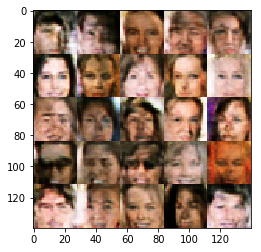

Epoch 2/8... steps:3020  Discriminator Loss: 1.0571... Generator Loss: 1.4375
Epoch 2/8... steps:3040  Discriminator Loss: 1.3573... Generator Loss: 0.6914
Epoch 2/8... steps:3060  Discriminator Loss: 1.5926... Generator Loss: 1.5817
Epoch 2/8... steps:3080  Discriminator Loss: 1.3150... Generator Loss: 0.6744
Epoch 2/8... steps:3100  Discriminator Loss: 1.1644... Generator Loss: 0.9834


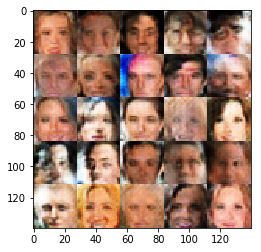

Epoch 2/8... steps:3120  Discriminator Loss: 1.0889... Generator Loss: 0.9773
Epoch 2/8... steps:3140  Discriminator Loss: 1.3169... Generator Loss: 0.6017
Epoch 2/8... steps:3160  Discriminator Loss: 1.2790... Generator Loss: 0.9001
Epoch 3/8... steps:3180  Discriminator Loss: 1.3092... Generator Loss: 1.0609
Epoch 3/8... steps:3200  Discriminator Loss: 1.2445... Generator Loss: 0.8459


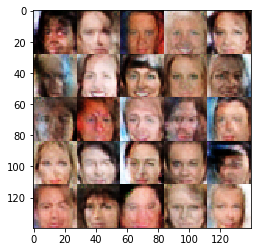

Epoch 3/8... steps:3220  Discriminator Loss: 1.3229... Generator Loss: 0.9135
Epoch 3/8... steps:3240  Discriminator Loss: 1.2138... Generator Loss: 1.0187
Epoch 3/8... steps:3260  Discriminator Loss: 1.1327... Generator Loss: 0.9184
Epoch 3/8... steps:3280  Discriminator Loss: 1.2859... Generator Loss: 1.0778
Epoch 3/8... steps:3300  Discriminator Loss: 1.3532... Generator Loss: 0.9132


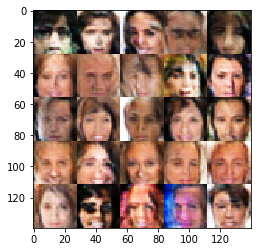

Epoch 3/8... steps:3320  Discriminator Loss: 1.3281... Generator Loss: 0.7570
Epoch 3/8... steps:3340  Discriminator Loss: 1.3001... Generator Loss: 0.7570
Epoch 3/8... steps:3360  Discriminator Loss: 1.2256... Generator Loss: 0.8086
Epoch 3/8... steps:3380  Discriminator Loss: 1.2758... Generator Loss: 0.8151
Epoch 3/8... steps:3400  Discriminator Loss: 1.1718... Generator Loss: 0.8672


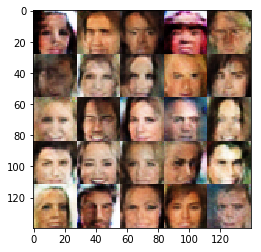

Epoch 3/8... steps:3420  Discriminator Loss: 1.2130... Generator Loss: 0.8257
Epoch 3/8... steps:3440  Discriminator Loss: 1.3331... Generator Loss: 0.8081
Epoch 3/8... steps:3460  Discriminator Loss: 1.2060... Generator Loss: 1.0967
Epoch 3/8... steps:3480  Discriminator Loss: 1.7519... Generator Loss: 0.3327
Epoch 3/8... steps:3500  Discriminator Loss: 1.3931... Generator Loss: 1.2959


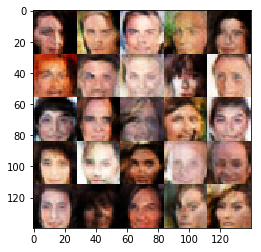

Epoch 3/8... steps:3520  Discriminator Loss: 1.2427... Generator Loss: 0.8213
Epoch 3/8... steps:3540  Discriminator Loss: 1.4100... Generator Loss: 1.2907
Epoch 3/8... steps:3560  Discriminator Loss: 1.3395... Generator Loss: 0.8093
Epoch 3/8... steps:3580  Discriminator Loss: 1.2986... Generator Loss: 0.7670
Epoch 3/8... steps:3600  Discriminator Loss: 1.1510... Generator Loss: 1.0232


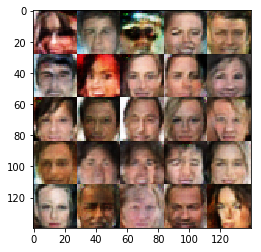

Epoch 3/8... steps:3620  Discriminator Loss: 1.2782... Generator Loss: 0.6606
Epoch 3/8... steps:3640  Discriminator Loss: 1.2207... Generator Loss: 1.2506
Epoch 3/8... steps:3660  Discriminator Loss: 1.2995... Generator Loss: 0.8221
Epoch 3/8... steps:3680  Discriminator Loss: 1.2800... Generator Loss: 1.0090
Epoch 3/8... steps:3700  Discriminator Loss: 1.3175... Generator Loss: 0.9207


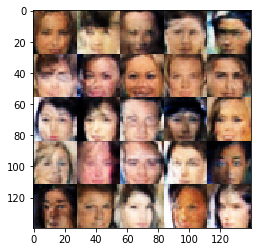

Epoch 3/8... steps:3720  Discriminator Loss: 1.2650... Generator Loss: 0.6892
Epoch 3/8... steps:3740  Discriminator Loss: 1.2948... Generator Loss: 0.9236
Epoch 3/8... steps:3760  Discriminator Loss: 1.1214... Generator Loss: 1.0784
Epoch 3/8... steps:3780  Discriminator Loss: 1.2354... Generator Loss: 0.9885
Epoch 3/8... steps:3800  Discriminator Loss: 1.2653... Generator Loss: 1.0894


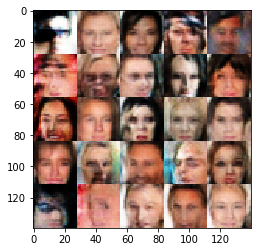

Epoch 3/8... steps:3820  Discriminator Loss: 1.1733... Generator Loss: 1.1010
Epoch 3/8... steps:3840  Discriminator Loss: 1.3172... Generator Loss: 0.6670
Epoch 3/8... steps:3860  Discriminator Loss: 1.1125... Generator Loss: 1.0225
Epoch 3/8... steps:3880  Discriminator Loss: 1.3405... Generator Loss: 0.7629
Epoch 3/8... steps:3900  Discriminator Loss: 1.2828... Generator Loss: 0.9003


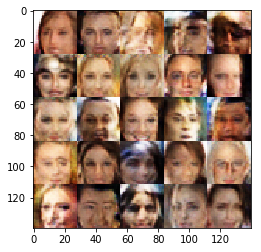

Epoch 3/8... steps:3920  Discriminator Loss: 1.2959... Generator Loss: 0.8797
Epoch 3/8... steps:3940  Discriminator Loss: 1.2473... Generator Loss: 0.8968
Epoch 3/8... steps:3960  Discriminator Loss: 1.2374... Generator Loss: 0.9598
Epoch 3/8... steps:3980  Discriminator Loss: 1.2055... Generator Loss: 0.8470
Epoch 3/8... steps:4000  Discriminator Loss: 1.3737... Generator Loss: 0.6257


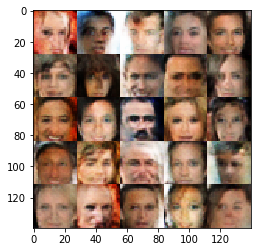

Epoch 3/8... steps:4020  Discriminator Loss: 1.2527... Generator Loss: 1.1306
Epoch 3/8... steps:4040  Discriminator Loss: 1.3065... Generator Loss: 0.8567
Epoch 3/8... steps:4060  Discriminator Loss: 1.2755... Generator Loss: 1.0936
Epoch 3/8... steps:4080  Discriminator Loss: 1.2018... Generator Loss: 0.7751
Epoch 3/8... steps:4100  Discriminator Loss: 1.2858... Generator Loss: 0.9499


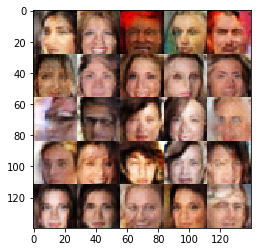

Epoch 3/8... steps:4120  Discriminator Loss: 1.3351... Generator Loss: 0.7617
Epoch 3/8... steps:4140  Discriminator Loss: 1.3335... Generator Loss: 0.6255
Epoch 3/8... steps:4160  Discriminator Loss: 1.2696... Generator Loss: 0.8740
Epoch 3/8... steps:4180  Discriminator Loss: 1.2579... Generator Loss: 0.8308
Epoch 3/8... steps:4200  Discriminator Loss: 1.3907... Generator Loss: 0.9016


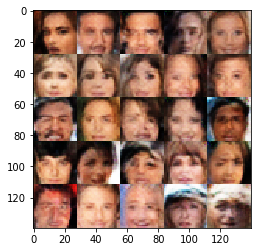

Epoch 3/8... steps:4220  Discriminator Loss: 1.2144... Generator Loss: 1.0387
Epoch 3/8... steps:4240  Discriminator Loss: 1.2989... Generator Loss: 0.7147
Epoch 3/8... steps:4260  Discriminator Loss: 1.2622... Generator Loss: 1.0024
Epoch 3/8... steps:4280  Discriminator Loss: 1.1403... Generator Loss: 1.2659
Epoch 3/8... steps:4300  Discriminator Loss: 1.2061... Generator Loss: 0.9765


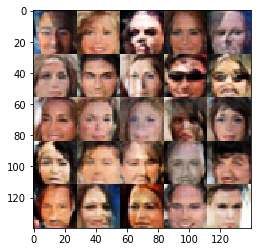

Epoch 3/8... steps:4320  Discriminator Loss: 1.2610... Generator Loss: 0.8601
Epoch 3/8... steps:4340  Discriminator Loss: 1.1612... Generator Loss: 1.2346
Epoch 3/8... steps:4360  Discriminator Loss: 1.2572... Generator Loss: 0.9441
Epoch 3/8... steps:4380  Discriminator Loss: 1.2405... Generator Loss: 0.7801
Epoch 3/8... steps:4400  Discriminator Loss: 1.3381... Generator Loss: 1.0316


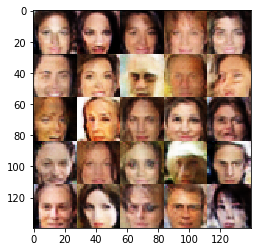

Epoch 3/8... steps:4420  Discriminator Loss: 1.1599... Generator Loss: 1.1153
Epoch 3/8... steps:4440  Discriminator Loss: 1.4166... Generator Loss: 1.4592
Epoch 3/8... steps:4460  Discriminator Loss: 1.3845... Generator Loss: 1.0292
Epoch 3/8... steps:4480  Discriminator Loss: 1.3611... Generator Loss: 1.0705
Epoch 3/8... steps:4500  Discriminator Loss: 1.2689... Generator Loss: 0.8036


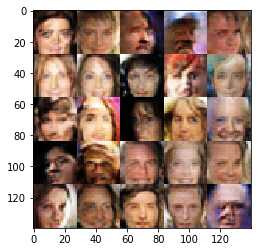

Epoch 3/8... steps:4520  Discriminator Loss: 1.1390... Generator Loss: 0.8927
Epoch 3/8... steps:4540  Discriminator Loss: 1.2871... Generator Loss: 0.6972
Epoch 3/8... steps:4560  Discriminator Loss: 1.3296... Generator Loss: 0.8517
Epoch 3/8... steps:4580  Discriminator Loss: 1.1720... Generator Loss: 0.9582
Epoch 3/8... steps:4600  Discriminator Loss: 1.3122... Generator Loss: 1.1762


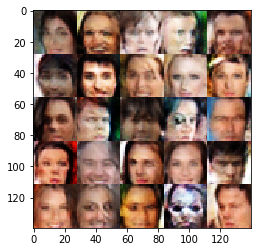

Epoch 3/8... steps:4620  Discriminator Loss: 1.3351... Generator Loss: 0.5886
Epoch 3/8... steps:4640  Discriminator Loss: 1.2362... Generator Loss: 1.0135
Epoch 3/8... steps:4660  Discriminator Loss: 1.2607... Generator Loss: 1.0596
Epoch 3/8... steps:4680  Discriminator Loss: 1.3340... Generator Loss: 0.6336
Epoch 3/8... steps:4700  Discriminator Loss: 1.3166... Generator Loss: 0.9801


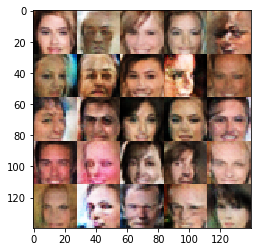

Epoch 3/8... steps:4720  Discriminator Loss: 1.2125... Generator Loss: 0.8774
Epoch 3/8... steps:4740  Discriminator Loss: 1.3884... Generator Loss: 0.5585
Epoch 4/8... steps:4760  Discriminator Loss: 1.2750... Generator Loss: 0.7562
Epoch 4/8... steps:4780  Discriminator Loss: 1.2299... Generator Loss: 0.9719
Epoch 4/8... steps:4800  Discriminator Loss: 1.2122... Generator Loss: 0.8757


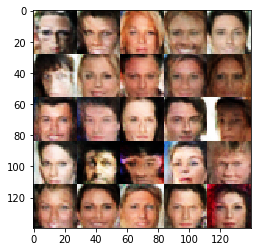

Epoch 4/8... steps:4820  Discriminator Loss: 1.2887... Generator Loss: 1.1125
Epoch 4/8... steps:4840  Discriminator Loss: 1.0830... Generator Loss: 1.0799
Epoch 4/8... steps:4860  Discriminator Loss: 1.2332... Generator Loss: 0.9780
Epoch 4/8... steps:4880  Discriminator Loss: 1.2132... Generator Loss: 1.0132
Epoch 4/8... steps:4900  Discriminator Loss: 1.2452... Generator Loss: 0.9761


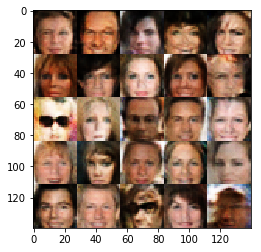

Epoch 4/8... steps:4920  Discriminator Loss: 1.2088... Generator Loss: 1.3277
Epoch 4/8... steps:4940  Discriminator Loss: 1.1935... Generator Loss: 0.9078
Epoch 4/8... steps:4960  Discriminator Loss: 1.2503... Generator Loss: 0.9054
Epoch 4/8... steps:4980  Discriminator Loss: 1.2001... Generator Loss: 0.8034
Epoch 4/8... steps:5000  Discriminator Loss: 1.2971... Generator Loss: 0.8998


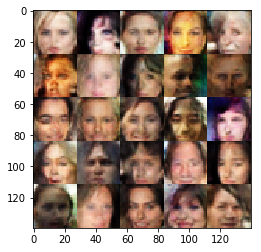

Epoch 4/8... steps:5020  Discriminator Loss: 1.1523... Generator Loss: 1.1406
Epoch 4/8... steps:5040  Discriminator Loss: 1.2374... Generator Loss: 0.7909
Epoch 4/8... steps:5060  Discriminator Loss: 1.3275... Generator Loss: 0.9402
Epoch 4/8... steps:5080  Discriminator Loss: 1.2680... Generator Loss: 1.2963
Epoch 4/8... steps:5100  Discriminator Loss: 1.3241... Generator Loss: 0.7581


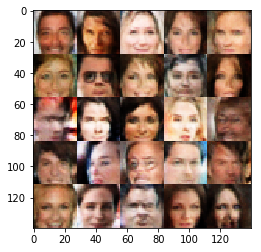

Epoch 4/8... steps:5120  Discriminator Loss: 1.2080... Generator Loss: 1.0091
Epoch 4/8... steps:5140  Discriminator Loss: 1.3525... Generator Loss: 0.6587
Epoch 4/8... steps:5160  Discriminator Loss: 1.2482... Generator Loss: 0.8633
Epoch 4/8... steps:5180  Discriminator Loss: 1.2577... Generator Loss: 0.9148
Epoch 4/8... steps:5200  Discriminator Loss: 1.2073... Generator Loss: 0.8258


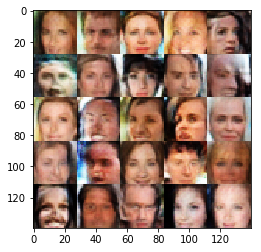

Epoch 4/8... steps:5220  Discriminator Loss: 1.2886... Generator Loss: 0.7925
Epoch 4/8... steps:5240  Discriminator Loss: 1.2978... Generator Loss: 0.9250
Epoch 4/8... steps:5260  Discriminator Loss: 1.3557... Generator Loss: 0.6572
Epoch 4/8... steps:5280  Discriminator Loss: 1.3387... Generator Loss: 0.6118
Epoch 4/8... steps:5300  Discriminator Loss: 1.2529... Generator Loss: 0.8568


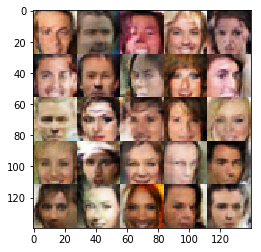

Epoch 4/8... steps:5320  Discriminator Loss: 1.3420... Generator Loss: 0.6615
Epoch 4/8... steps:5340  Discriminator Loss: 1.3106... Generator Loss: 1.0118
Epoch 4/8... steps:5360  Discriminator Loss: 1.3331... Generator Loss: 0.5967
Epoch 4/8... steps:5380  Discriminator Loss: 1.1512... Generator Loss: 1.2186
Epoch 4/8... steps:5400  Discriminator Loss: 1.2718... Generator Loss: 0.8949


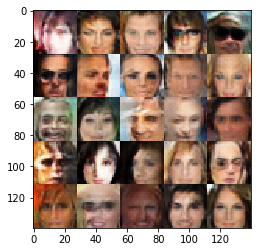

Epoch 4/8... steps:5420  Discriminator Loss: 1.2232... Generator Loss: 0.9623
Epoch 4/8... steps:5440  Discriminator Loss: 1.2393... Generator Loss: 0.7894
Epoch 4/8... steps:5460  Discriminator Loss: 1.3326... Generator Loss: 0.6831
Epoch 4/8... steps:5480  Discriminator Loss: 1.2512... Generator Loss: 0.6856
Epoch 4/8... steps:5500  Discriminator Loss: 1.2726... Generator Loss: 0.8548


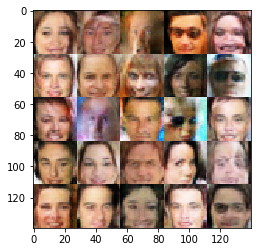

Epoch 4/8... steps:5520  Discriminator Loss: 1.2295... Generator Loss: 0.9844
Epoch 4/8... steps:5540  Discriminator Loss: 1.2999... Generator Loss: 0.8378
Epoch 4/8... steps:5560  Discriminator Loss: 1.1444... Generator Loss: 0.9383
Epoch 4/8... steps:5580  Discriminator Loss: 1.2578... Generator Loss: 0.8191
Epoch 4/8... steps:5600  Discriminator Loss: 1.2721... Generator Loss: 0.8000


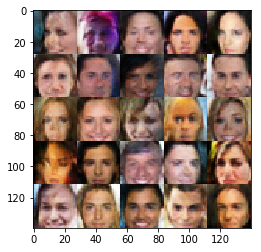

Epoch 4/8... steps:5620  Discriminator Loss: 1.2735... Generator Loss: 0.8642
Epoch 4/8... steps:5640  Discriminator Loss: 1.1979... Generator Loss: 0.8924
Epoch 4/8... steps:5660  Discriminator Loss: 1.2686... Generator Loss: 0.8095
Epoch 4/8... steps:5680  Discriminator Loss: 1.1553... Generator Loss: 1.0726
Epoch 4/8... steps:5700  Discriminator Loss: 1.2600... Generator Loss: 0.8519


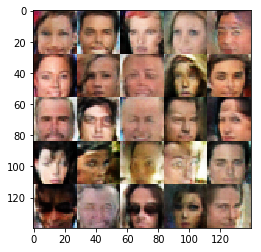

Epoch 4/8... steps:5720  Discriminator Loss: 1.1899... Generator Loss: 0.7863
Epoch 4/8... steps:5740  Discriminator Loss: 1.2768... Generator Loss: 0.6555
Epoch 4/8... steps:5760  Discriminator Loss: 1.3002... Generator Loss: 0.8510
Epoch 4/8... steps:5780  Discriminator Loss: 1.2854... Generator Loss: 0.8337
Epoch 4/8... steps:5800  Discriminator Loss: 1.2041... Generator Loss: 0.8593


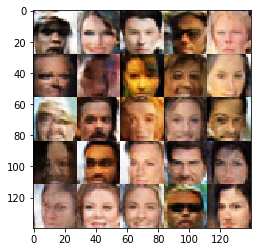

Epoch 4/8... steps:5820  Discriminator Loss: 1.2519... Generator Loss: 0.7949
Epoch 4/8... steps:5840  Discriminator Loss: 1.2792... Generator Loss: 0.9707
Epoch 4/8... steps:5860  Discriminator Loss: 1.2886... Generator Loss: 0.6785
Epoch 4/8... steps:5880  Discriminator Loss: 1.2559... Generator Loss: 0.7750
Epoch 4/8... steps:5900  Discriminator Loss: 1.2415... Generator Loss: 0.9016


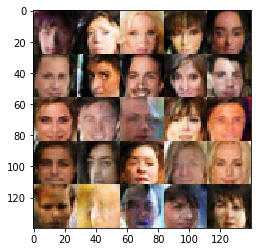

Epoch 4/8... steps:5920  Discriminator Loss: 1.4418... Generator Loss: 0.5187
Epoch 4/8... steps:5940  Discriminator Loss: 1.2580... Generator Loss: 0.7281
Epoch 4/8... steps:5960  Discriminator Loss: 1.2352... Generator Loss: 0.9083
Epoch 4/8... steps:5980  Discriminator Loss: 1.2427... Generator Loss: 0.8752
Epoch 4/8... steps:6000  Discriminator Loss: 1.2069... Generator Loss: 1.3530


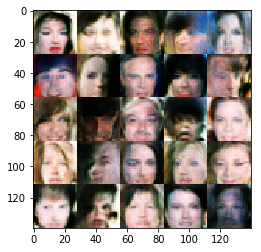

Epoch 4/8... steps:6020  Discriminator Loss: 1.3110... Generator Loss: 0.9535
Epoch 4/8... steps:6040  Discriminator Loss: 1.2115... Generator Loss: 0.9712
Epoch 4/8... steps:6060  Discriminator Loss: 1.2156... Generator Loss: 0.8692
Epoch 4/8... steps:6080  Discriminator Loss: 1.2728... Generator Loss: 0.6852
Epoch 4/8... steps:6100  Discriminator Loss: 1.2501... Generator Loss: 0.7595


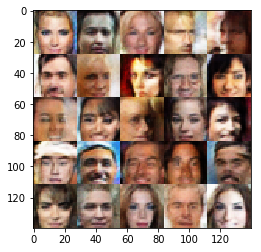

Epoch 4/8... steps:6120  Discriminator Loss: 1.3626... Generator Loss: 0.8972
Epoch 4/8... steps:6140  Discriminator Loss: 1.2106... Generator Loss: 0.9655
Epoch 4/8... steps:6160  Discriminator Loss: 1.2200... Generator Loss: 0.9371
Epoch 4/8... steps:6180  Discriminator Loss: 1.2859... Generator Loss: 0.9733
Epoch 4/8... steps:6200  Discriminator Loss: 1.2103... Generator Loss: 1.0558


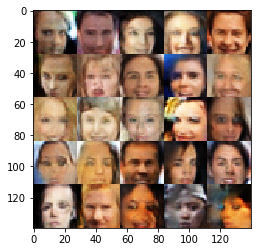

Epoch 4/8... steps:6220  Discriminator Loss: 1.2525... Generator Loss: 0.7348
Epoch 4/8... steps:6240  Discriminator Loss: 1.2810... Generator Loss: 1.0172
Epoch 4/8... steps:6260  Discriminator Loss: 1.3049... Generator Loss: 1.3645
Epoch 4/8... steps:6280  Discriminator Loss: 1.3178... Generator Loss: 0.6056
Epoch 4/8... steps:6300  Discriminator Loss: 1.3312... Generator Loss: 0.9671


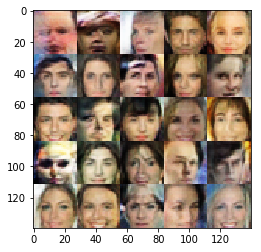

Epoch 4/8... steps:6320  Discriminator Loss: 1.2753... Generator Loss: 0.9595
Epoch 5/8... steps:6340  Discriminator Loss: 1.3757... Generator Loss: 0.5481
Epoch 5/8... steps:6360  Discriminator Loss: 1.3438... Generator Loss: 0.7873
Epoch 5/8... steps:6380  Discriminator Loss: 1.2342... Generator Loss: 0.8234
Epoch 5/8... steps:6400  Discriminator Loss: 1.3534... Generator Loss: 1.1084


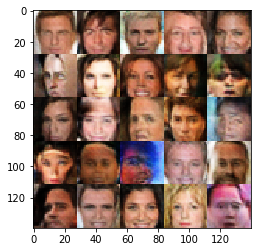

Epoch 5/8... steps:6420  Discriminator Loss: 1.3011... Generator Loss: 0.7277
Epoch 5/8... steps:6440  Discriminator Loss: 1.0867... Generator Loss: 0.9170
Epoch 5/8... steps:6460  Discriminator Loss: 1.3207... Generator Loss: 0.7205
Epoch 5/8... steps:6480  Discriminator Loss: 1.2893... Generator Loss: 0.7583
Epoch 5/8... steps:6500  Discriminator Loss: 1.2420... Generator Loss: 0.7670


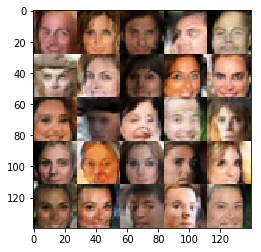

Epoch 5/8... steps:6520  Discriminator Loss: 1.2937... Generator Loss: 0.7040
Epoch 5/8... steps:6540  Discriminator Loss: 1.2547... Generator Loss: 0.7429
Epoch 5/8... steps:6560  Discriminator Loss: 1.3228... Generator Loss: 0.5873
Epoch 5/8... steps:6580  Discriminator Loss: 1.2847... Generator Loss: 0.8360
Epoch 5/8... steps:6600  Discriminator Loss: 1.5248... Generator Loss: 1.2988


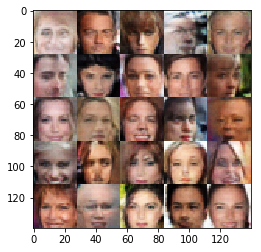

Epoch 5/8... steps:6620  Discriminator Loss: 1.2050... Generator Loss: 0.8131
Epoch 5/8... steps:6640  Discriminator Loss: 1.3549... Generator Loss: 0.6045
Epoch 5/8... steps:6660  Discriminator Loss: 1.2433... Generator Loss: 0.9728
Epoch 5/8... steps:6680  Discriminator Loss: 1.2925... Generator Loss: 1.1535
Epoch 5/8... steps:6700  Discriminator Loss: 1.3353... Generator Loss: 0.5825


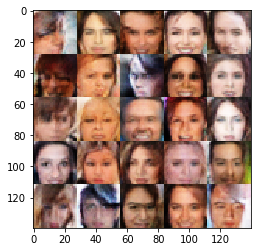

Epoch 5/8... steps:6720  Discriminator Loss: 1.3046... Generator Loss: 0.8415
Epoch 5/8... steps:6740  Discriminator Loss: 1.1988... Generator Loss: 0.9060
Epoch 5/8... steps:6760  Discriminator Loss: 1.1759... Generator Loss: 0.8871
Epoch 5/8... steps:6780  Discriminator Loss: 1.2778... Generator Loss: 0.8981
Epoch 5/8... steps:6800  Discriminator Loss: 1.3055... Generator Loss: 0.8066


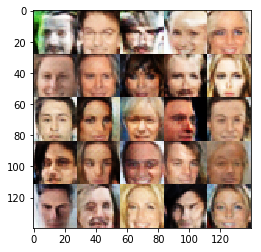

Epoch 5/8... steps:6820  Discriminator Loss: 1.3287... Generator Loss: 0.6455
Epoch 5/8... steps:6840  Discriminator Loss: 1.3169... Generator Loss: 0.6819
Epoch 5/8... steps:6860  Discriminator Loss: 1.6230... Generator Loss: 2.9596
Epoch 5/8... steps:6880  Discriminator Loss: 1.2901... Generator Loss: 0.9938
Epoch 5/8... steps:6900  Discriminator Loss: 1.2333... Generator Loss: 0.9282


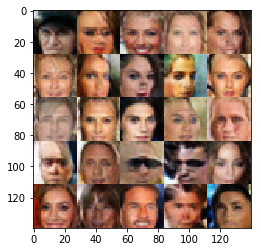

Epoch 5/8... steps:6920  Discriminator Loss: 1.2634... Generator Loss: 0.7765
Epoch 5/8... steps:6940  Discriminator Loss: 1.1341... Generator Loss: 1.0082
Epoch 5/8... steps:6960  Discriminator Loss: 1.1972... Generator Loss: 0.8924
Epoch 5/8... steps:6980  Discriminator Loss: 1.2807... Generator Loss: 0.7391
Epoch 5/8... steps:7000  Discriminator Loss: 1.1355... Generator Loss: 1.0470


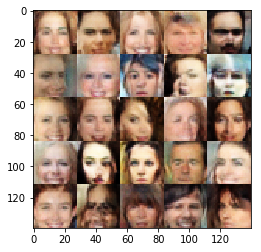

Epoch 5/8... steps:7020  Discriminator Loss: 1.1584... Generator Loss: 0.9754
Epoch 5/8... steps:7040  Discriminator Loss: 1.7054... Generator Loss: 0.3430
Epoch 5/8... steps:7060  Discriminator Loss: 1.1970... Generator Loss: 0.9232
Epoch 5/8... steps:7080  Discriminator Loss: 1.1749... Generator Loss: 1.0841
Epoch 5/8... steps:7100  Discriminator Loss: 1.2850... Generator Loss: 0.8088


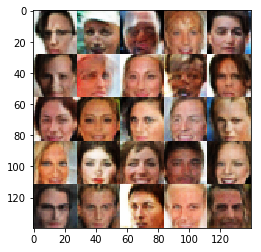

Epoch 5/8... steps:7120  Discriminator Loss: 1.2446... Generator Loss: 0.7898
Epoch 5/8... steps:7140  Discriminator Loss: 1.2969... Generator Loss: 0.7759
Epoch 5/8... steps:7160  Discriminator Loss: 1.1843... Generator Loss: 0.9628
Epoch 5/8... steps:7180  Discriminator Loss: 1.2468... Generator Loss: 0.7389
Epoch 5/8... steps:7200  Discriminator Loss: 1.1293... Generator Loss: 1.0846


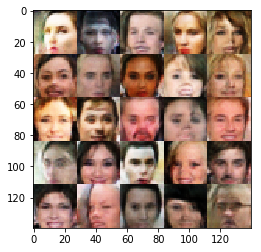

Epoch 5/8... steps:7220  Discriminator Loss: 1.3473... Generator Loss: 0.8168
Epoch 5/8... steps:7240  Discriminator Loss: 1.0858... Generator Loss: 1.2057
Epoch 5/8... steps:7260  Discriminator Loss: 1.1645... Generator Loss: 0.8894
Epoch 5/8... steps:7280  Discriminator Loss: 1.2268... Generator Loss: 0.8040
Epoch 5/8... steps:7300  Discriminator Loss: 1.3125... Generator Loss: 0.6794


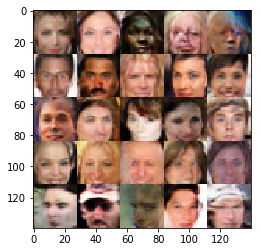

Epoch 5/8... steps:7320  Discriminator Loss: 1.2768... Generator Loss: 0.9001
Epoch 5/8... steps:7340  Discriminator Loss: 1.3242... Generator Loss: 1.4753
Epoch 5/8... steps:7360  Discriminator Loss: 1.2042... Generator Loss: 1.0505
Epoch 5/8... steps:7380  Discriminator Loss: 1.2647... Generator Loss: 0.7348
Epoch 5/8... steps:7400  Discriminator Loss: 1.1528... Generator Loss: 0.8885


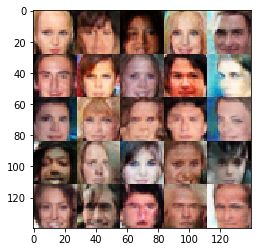

Epoch 5/8... steps:7420  Discriminator Loss: 1.1418... Generator Loss: 1.0822
Epoch 5/8... steps:7440  Discriminator Loss: 1.4207... Generator Loss: 0.7190
Epoch 5/8... steps:7460  Discriminator Loss: 1.1478... Generator Loss: 0.9403
Epoch 5/8... steps:7480  Discriminator Loss: 1.3843... Generator Loss: 0.6066
Epoch 5/8... steps:7500  Discriminator Loss: 1.4722... Generator Loss: 0.4651


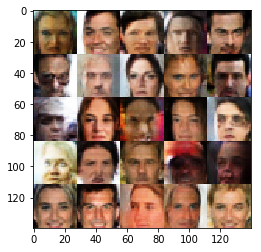

Epoch 5/8... steps:7520  Discriminator Loss: 1.2969... Generator Loss: 0.6462
Epoch 5/8... steps:7540  Discriminator Loss: 1.1990... Generator Loss: 1.0124
Epoch 5/8... steps:7560  Discriminator Loss: 1.2777... Generator Loss: 0.6728
Epoch 5/8... steps:7580  Discriminator Loss: 1.1803... Generator Loss: 0.8189
Epoch 5/8... steps:7600  Discriminator Loss: 1.1496... Generator Loss: 0.8840


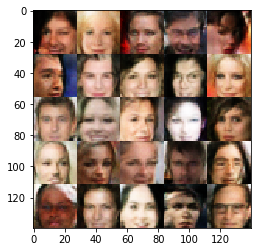

Epoch 5/8... steps:7620  Discriminator Loss: 1.2595... Generator Loss: 0.8920
Epoch 5/8... steps:7640  Discriminator Loss: 1.0439... Generator Loss: 1.3042
Epoch 5/8... steps:7660  Discriminator Loss: 1.2568... Generator Loss: 1.2094
Epoch 5/8... steps:7680  Discriminator Loss: 1.1765... Generator Loss: 0.8370
Epoch 5/8... steps:7700  Discriminator Loss: 1.2471... Generator Loss: 1.2506


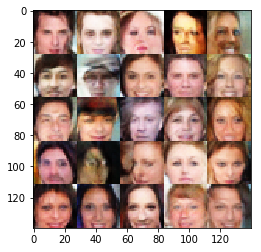

Epoch 5/8... steps:7720  Discriminator Loss: 1.1287... Generator Loss: 1.0792
Epoch 5/8... steps:7740  Discriminator Loss: 1.1441... Generator Loss: 1.1523
Epoch 5/8... steps:7760  Discriminator Loss: 1.1838... Generator Loss: 1.1438
Epoch 5/8... steps:7780  Discriminator Loss: 1.2972... Generator Loss: 0.7486
Epoch 5/8... steps:7800  Discriminator Loss: 1.2256... Generator Loss: 0.8324


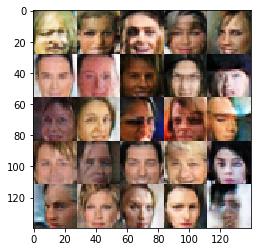

Epoch 5/8... steps:7820  Discriminator Loss: 1.1325... Generator Loss: 1.2129
Epoch 5/8... steps:7840  Discriminator Loss: 1.1146... Generator Loss: 1.0637
Epoch 5/8... steps:7860  Discriminator Loss: 1.3718... Generator Loss: 0.5553
Epoch 5/8... steps:7880  Discriminator Loss: 1.1074... Generator Loss: 1.0017
Epoch 5/8... steps:7900  Discriminator Loss: 1.2856... Generator Loss: 0.6483


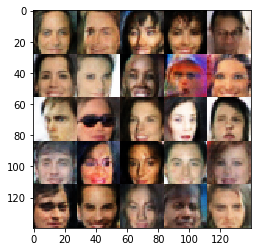

Epoch 6/8... steps:7920  Discriminator Loss: 1.1323... Generator Loss: 1.1771
Epoch 6/8... steps:7940  Discriminator Loss: 1.0114... Generator Loss: 0.8884
Epoch 6/8... steps:7960  Discriminator Loss: 1.1905... Generator Loss: 1.1052
Epoch 6/8... steps:7980  Discriminator Loss: 1.1782... Generator Loss: 0.7524
Epoch 6/8... steps:8000  Discriminator Loss: 1.1662... Generator Loss: 0.7633


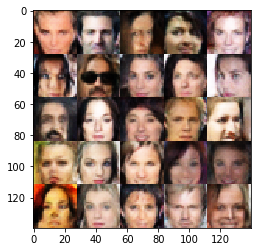

Epoch 6/8... steps:8020  Discriminator Loss: 1.3377... Generator Loss: 0.6558
Epoch 6/8... steps:8040  Discriminator Loss: 1.1598... Generator Loss: 1.3464
Epoch 6/8... steps:8060  Discriminator Loss: 1.0153... Generator Loss: 0.9304
Epoch 6/8... steps:8080  Discriminator Loss: 1.2302... Generator Loss: 0.8370
Epoch 6/8... steps:8100  Discriminator Loss: 1.3319... Generator Loss: 1.2406


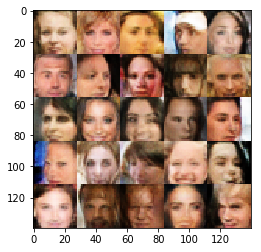

Epoch 6/8... steps:8120  Discriminator Loss: 1.3046... Generator Loss: 0.6368
Epoch 6/8... steps:8140  Discriminator Loss: 1.3135... Generator Loss: 0.6233
Epoch 6/8... steps:8160  Discriminator Loss: 1.0922... Generator Loss: 1.1175
Epoch 6/8... steps:8180  Discriminator Loss: 1.3958... Generator Loss: 0.6866
Epoch 6/8... steps:8200  Discriminator Loss: 1.4951... Generator Loss: 0.4615


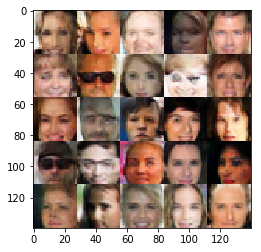

Epoch 6/8... steps:8220  Discriminator Loss: 1.3542... Generator Loss: 0.7646
Epoch 6/8... steps:8240  Discriminator Loss: 1.1998... Generator Loss: 0.7418
Epoch 6/8... steps:8260  Discriminator Loss: 1.3262... Generator Loss: 1.2828
Epoch 6/8... steps:8280  Discriminator Loss: 1.1956... Generator Loss: 0.9168
Epoch 6/8... steps:8300  Discriminator Loss: 1.1537... Generator Loss: 0.8328


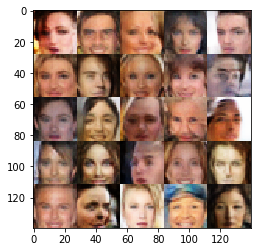

Epoch 6/8... steps:8320  Discriminator Loss: 1.2344... Generator Loss: 0.8222
Epoch 6/8... steps:8340  Discriminator Loss: 1.2562... Generator Loss: 0.7248
Epoch 6/8... steps:8360  Discriminator Loss: 1.1316... Generator Loss: 1.0441
Epoch 6/8... steps:8380  Discriminator Loss: 1.3813... Generator Loss: 0.6481
Epoch 6/8... steps:8400  Discriminator Loss: 1.2377... Generator Loss: 0.7363


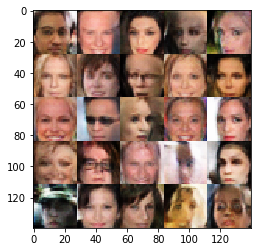

Epoch 6/8... steps:8420  Discriminator Loss: 1.3189... Generator Loss: 0.6651
Epoch 6/8... steps:8440  Discriminator Loss: 1.3102... Generator Loss: 0.6520
Epoch 6/8... steps:8460  Discriminator Loss: 1.1374... Generator Loss: 1.0497
Epoch 6/8... steps:8480  Discriminator Loss: 1.2131... Generator Loss: 1.2002
Epoch 6/8... steps:8500  Discriminator Loss: 1.1067... Generator Loss: 1.6852


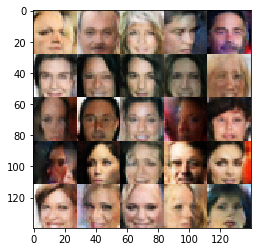

Epoch 6/8... steps:8520  Discriminator Loss: 1.4288... Generator Loss: 0.5343
Epoch 6/8... steps:8540  Discriminator Loss: 1.3394... Generator Loss: 0.5519
Epoch 6/8... steps:8560  Discriminator Loss: 1.3041... Generator Loss: 0.6205
Epoch 6/8... steps:8580  Discriminator Loss: 1.1949... Generator Loss: 1.0683
Epoch 6/8... steps:8600  Discriminator Loss: 1.2543... Generator Loss: 1.6448


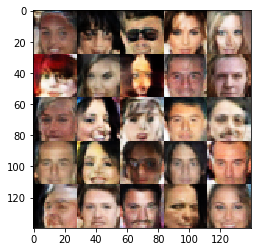

Epoch 6/8... steps:8620  Discriminator Loss: 1.0638... Generator Loss: 0.9596
Epoch 6/8... steps:8640  Discriminator Loss: 1.3413... Generator Loss: 0.8300
Epoch 6/8... steps:8660  Discriminator Loss: 1.2879... Generator Loss: 0.7294
Epoch 6/8... steps:8680  Discriminator Loss: 1.1491... Generator Loss: 0.7960
Epoch 6/8... steps:8700  Discriminator Loss: 1.2344... Generator Loss: 0.7992


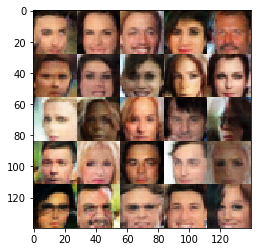

Epoch 6/8... steps:8720  Discriminator Loss: 1.2476... Generator Loss: 0.6566
Epoch 6/8... steps:8740  Discriminator Loss: 1.3128... Generator Loss: 0.6123
Epoch 6/8... steps:8760  Discriminator Loss: 1.2838... Generator Loss: 1.4270
Epoch 6/8... steps:8780  Discriminator Loss: 1.1952... Generator Loss: 0.7996
Epoch 6/8... steps:8800  Discriminator Loss: 1.1961... Generator Loss: 0.7748


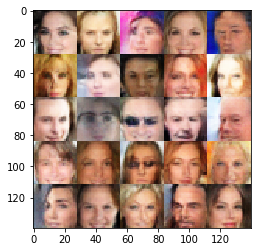

Epoch 6/8... steps:8820  Discriminator Loss: 1.1638... Generator Loss: 0.9733
Epoch 6/8... steps:8840  Discriminator Loss: 1.2610... Generator Loss: 0.7911
Epoch 6/8... steps:8860  Discriminator Loss: 1.2407... Generator Loss: 0.9834
Epoch 6/8... steps:8880  Discriminator Loss: 1.2546... Generator Loss: 0.9755
Epoch 6/8... steps:8900  Discriminator Loss: 1.2682... Generator Loss: 0.7190


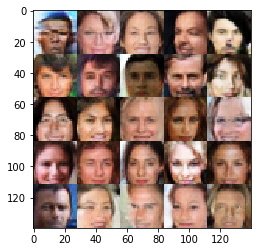

Epoch 6/8... steps:8920  Discriminator Loss: 1.1581... Generator Loss: 0.8614
Epoch 6/8... steps:8940  Discriminator Loss: 1.3767... Generator Loss: 0.5606
Epoch 6/8... steps:8960  Discriminator Loss: 1.2278... Generator Loss: 1.0201
Epoch 6/8... steps:8980  Discriminator Loss: 1.2349... Generator Loss: 1.1547
Epoch 6/8... steps:9000  Discriminator Loss: 1.2019... Generator Loss: 0.9612


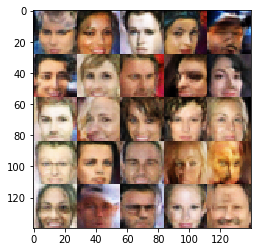

Epoch 6/8... steps:9020  Discriminator Loss: 1.1841... Generator Loss: 0.7838
Epoch 6/8... steps:9040  Discriminator Loss: 1.2937... Generator Loss: 0.6883
Epoch 6/8... steps:9060  Discriminator Loss: 1.3536... Generator Loss: 0.5926
Epoch 6/8... steps:9080  Discriminator Loss: 1.2611... Generator Loss: 0.6606
Epoch 6/8... steps:9100  Discriminator Loss: 1.1701... Generator Loss: 0.8565


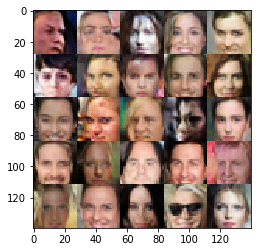

Epoch 6/8... steps:9120  Discriminator Loss: 1.0941... Generator Loss: 0.9926
Epoch 6/8... steps:9140  Discriminator Loss: 1.2274... Generator Loss: 0.8209
Epoch 6/8... steps:9160  Discriminator Loss: 1.1145... Generator Loss: 1.0219
Epoch 6/8... steps:9180  Discriminator Loss: 1.1919... Generator Loss: 0.9775
Epoch 6/8... steps:9200  Discriminator Loss: 1.2968... Generator Loss: 0.6410


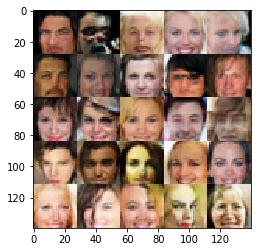

Epoch 6/8... steps:9220  Discriminator Loss: 1.1929... Generator Loss: 0.7425
Epoch 6/8... steps:9240  Discriminator Loss: 1.2718... Generator Loss: 0.8534
Epoch 6/8... steps:9260  Discriminator Loss: 1.0508... Generator Loss: 1.0582
Epoch 6/8... steps:9280  Discriminator Loss: 1.1236... Generator Loss: 1.0247
Epoch 6/8... steps:9300  Discriminator Loss: 1.4131... Generator Loss: 0.5145


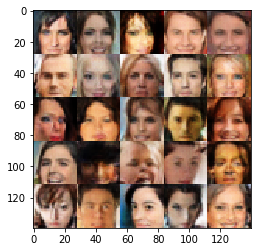

Epoch 6/8... steps:9320  Discriminator Loss: 1.0539... Generator Loss: 0.8736
Epoch 6/8... steps:9340  Discriminator Loss: 1.1667... Generator Loss: 0.9464
Epoch 6/8... steps:9360  Discriminator Loss: 1.3217... Generator Loss: 0.5937
Epoch 6/8... steps:9380  Discriminator Loss: 1.0332... Generator Loss: 1.0791
Epoch 6/8... steps:9400  Discriminator Loss: 1.1812... Generator Loss: 0.9010


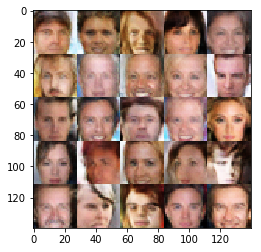

Epoch 6/8... steps:9420  Discriminator Loss: 1.0464... Generator Loss: 1.2416
Epoch 6/8... steps:9440  Discriminator Loss: 1.2388... Generator Loss: 0.8199
Epoch 6/8... steps:9460  Discriminator Loss: 1.3500... Generator Loss: 0.5647
Epoch 6/8... steps:9480  Discriminator Loss: 1.2683... Generator Loss: 1.2109
Epoch 7/8... steps:9500  Discriminator Loss: 1.2428... Generator Loss: 1.3125


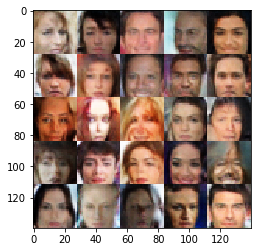

Epoch 7/8... steps:9520  Discriminator Loss: 1.1012... Generator Loss: 0.8968
Epoch 7/8... steps:9540  Discriminator Loss: 1.1504... Generator Loss: 1.0522
Epoch 7/8... steps:9560  Discriminator Loss: 1.0680... Generator Loss: 0.9386
Epoch 7/8... steps:9580  Discriminator Loss: 1.2019... Generator Loss: 0.7199
Epoch 7/8... steps:9600  Discriminator Loss: 1.2343... Generator Loss: 0.7358


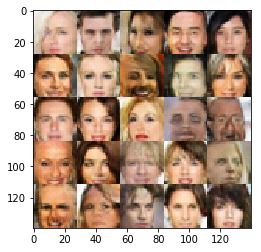

Epoch 7/8... steps:9620  Discriminator Loss: 1.3449... Generator Loss: 0.6575
Epoch 7/8... steps:9640  Discriminator Loss: 1.2070... Generator Loss: 1.0280
Epoch 7/8... steps:9660  Discriminator Loss: 1.1281... Generator Loss: 0.8805
Epoch 7/8... steps:9680  Discriminator Loss: 1.1977... Generator Loss: 0.9304
Epoch 7/8... steps:9700  Discriminator Loss: 1.2039... Generator Loss: 0.7627


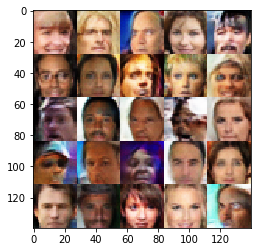

Epoch 7/8... steps:9720  Discriminator Loss: 1.3192... Generator Loss: 0.6220
Epoch 7/8... steps:9740  Discriminator Loss: 1.2106... Generator Loss: 0.7158
Epoch 7/8... steps:9760  Discriminator Loss: 1.2216... Generator Loss: 0.6767
Epoch 7/8... steps:9780  Discriminator Loss: 1.4884... Generator Loss: 0.5462
Epoch 7/8... steps:9800  Discriminator Loss: 1.1842... Generator Loss: 1.0063


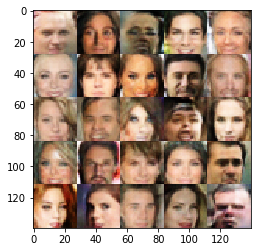

Epoch 7/8... steps:9820  Discriminator Loss: 1.1296... Generator Loss: 0.8164
Epoch 7/8... steps:9840  Discriminator Loss: 1.1472... Generator Loss: 0.9887
Epoch 7/8... steps:9860  Discriminator Loss: 1.1502... Generator Loss: 1.2650
Epoch 7/8... steps:9880  Discriminator Loss: 1.3735... Generator Loss: 1.0147
Epoch 7/8... steps:9900  Discriminator Loss: 1.1354... Generator Loss: 0.9726


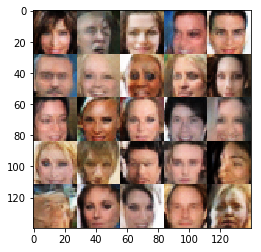

Epoch 7/8... steps:9920  Discriminator Loss: 1.1486... Generator Loss: 0.8388
Epoch 7/8... steps:9940  Discriminator Loss: 1.0367... Generator Loss: 0.9052
Epoch 7/8... steps:9960  Discriminator Loss: 1.1315... Generator Loss: 0.7598
Epoch 7/8... steps:9980  Discriminator Loss: 1.1559... Generator Loss: 0.8729
Epoch 7/8... steps:10000  Discriminator Loss: 0.9105... Generator Loss: 1.2892


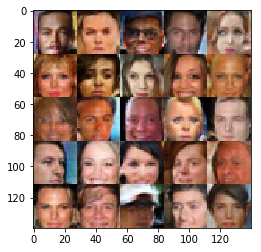

Epoch 7/8... steps:10020  Discriminator Loss: 1.2323... Generator Loss: 1.2568
Epoch 7/8... steps:10040  Discriminator Loss: 1.0932... Generator Loss: 0.9431
Epoch 7/8... steps:10060  Discriminator Loss: 1.1342... Generator Loss: 0.8179
Epoch 7/8... steps:10080  Discriminator Loss: 1.2638... Generator Loss: 0.7706
Epoch 7/8... steps:10100  Discriminator Loss: 1.2507... Generator Loss: 0.8080


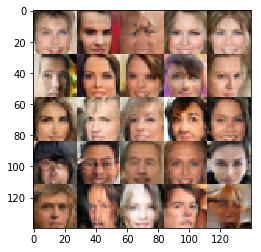

Epoch 7/8... steps:10120  Discriminator Loss: 1.3448... Generator Loss: 0.6400
Epoch 7/8... steps:10140  Discriminator Loss: 1.1043... Generator Loss: 1.0534
Epoch 7/8... steps:10160  Discriminator Loss: 1.0455... Generator Loss: 1.0830
Epoch 7/8... steps:10180  Discriminator Loss: 1.4920... Generator Loss: 1.0189
Epoch 7/8... steps:10200  Discriminator Loss: 0.9176... Generator Loss: 1.6233


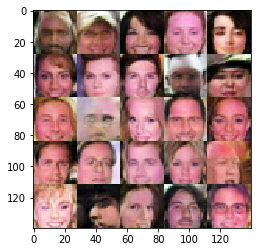

Epoch 7/8... steps:10220  Discriminator Loss: 1.0764... Generator Loss: 1.0150
Epoch 7/8... steps:10240  Discriminator Loss: 1.2521... Generator Loss: 4.2037
Epoch 7/8... steps:10260  Discriminator Loss: 1.3234... Generator Loss: 0.7416
Epoch 7/8... steps:10280  Discriminator Loss: 1.2130... Generator Loss: 1.2028
Epoch 7/8... steps:10300  Discriminator Loss: 1.2506... Generator Loss: 1.2008


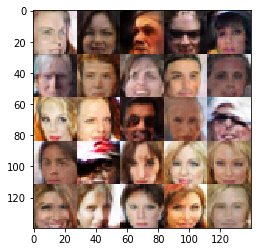

Epoch 7/8... steps:10320  Discriminator Loss: 1.2942... Generator Loss: 0.6477
Epoch 7/8... steps:10340  Discriminator Loss: 1.3277... Generator Loss: 0.6067
Epoch 7/8... steps:10360  Discriminator Loss: 1.1902... Generator Loss: 0.6643
Epoch 7/8... steps:10380  Discriminator Loss: 1.1632... Generator Loss: 0.9933
Epoch 7/8... steps:10400  Discriminator Loss: 1.1452... Generator Loss: 0.9497


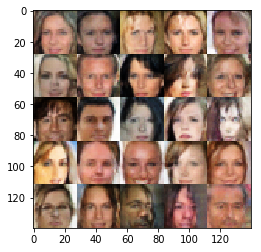

Epoch 7/8... steps:10420  Discriminator Loss: 1.0785... Generator Loss: 1.4195
Epoch 7/8... steps:10440  Discriminator Loss: 1.1075... Generator Loss: 1.0483
Epoch 7/8... steps:10460  Discriminator Loss: 1.2120... Generator Loss: 0.7182
Epoch 7/8... steps:10480  Discriminator Loss: 1.0630... Generator Loss: 1.2696
Epoch 7/8... steps:10500  Discriminator Loss: 1.2147... Generator Loss: 0.6780


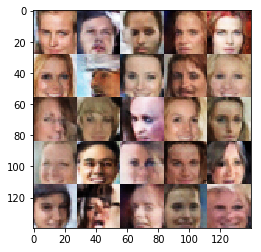

Epoch 7/8... steps:10520  Discriminator Loss: 1.4590... Generator Loss: 0.5046
Epoch 7/8... steps:10540  Discriminator Loss: 1.1758... Generator Loss: 1.2167
Epoch 7/8... steps:10560  Discriminator Loss: 1.4195... Generator Loss: 0.5691
Epoch 7/8... steps:10580  Discriminator Loss: 1.3837... Generator Loss: 0.5780
Epoch 7/8... steps:10600  Discriminator Loss: 1.7641... Generator Loss: 0.3516


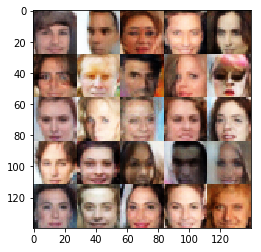

Epoch 7/8... steps:10620  Discriminator Loss: 1.2063... Generator Loss: 0.8099
Epoch 7/8... steps:10640  Discriminator Loss: 1.2183... Generator Loss: 0.6861
Epoch 7/8... steps:10660  Discriminator Loss: 1.3091... Generator Loss: 0.6429
Epoch 7/8... steps:10680  Discriminator Loss: 1.1133... Generator Loss: 0.9272
Epoch 7/8... steps:10700  Discriminator Loss: 1.0213... Generator Loss: 1.2129


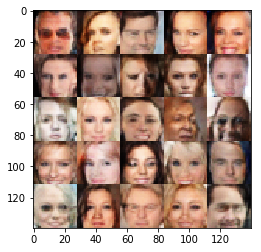

Epoch 7/8... steps:10720  Discriminator Loss: 1.3937... Generator Loss: 0.5490
Epoch 7/8... steps:10740  Discriminator Loss: 1.2599... Generator Loss: 0.7908
Epoch 7/8... steps:10760  Discriminator Loss: 1.1255... Generator Loss: 1.0116
Epoch 7/8... steps:10780  Discriminator Loss: 1.2767... Generator Loss: 0.6243
Epoch 7/8... steps:10800  Discriminator Loss: 1.1288... Generator Loss: 1.1235


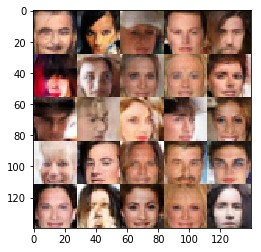

Epoch 7/8... steps:10820  Discriminator Loss: 1.0774... Generator Loss: 1.0058
Epoch 7/8... steps:10840  Discriminator Loss: 1.2087... Generator Loss: 0.8362
Epoch 7/8... steps:10860  Discriminator Loss: 1.5622... Generator Loss: 0.4689
Epoch 7/8... steps:10880  Discriminator Loss: 1.2368... Generator Loss: 1.0923
Epoch 7/8... steps:10900  Discriminator Loss: 1.4638... Generator Loss: 0.4613


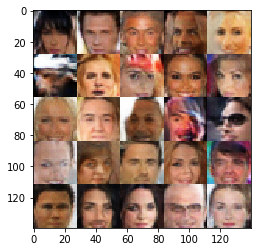

Epoch 7/8... steps:10920  Discriminator Loss: 1.4595... Generator Loss: 0.5180
Epoch 7/8... steps:10940  Discriminator Loss: 1.0447... Generator Loss: 0.8318
Epoch 7/8... steps:10960  Discriminator Loss: 1.1474... Generator Loss: 0.9151
Epoch 7/8... steps:10980  Discriminator Loss: 1.1922... Generator Loss: 1.4977
Epoch 7/8... steps:11000  Discriminator Loss: 1.0076... Generator Loss: 1.0190


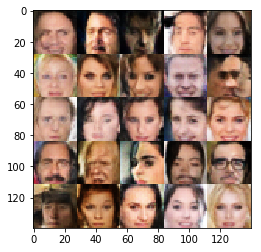

Epoch 7/8... steps:11020  Discriminator Loss: 1.1778... Generator Loss: 0.7880
Epoch 7/8... steps:11040  Discriminator Loss: 1.0386... Generator Loss: 0.9429
Epoch 7/8... steps:11060  Discriminator Loss: 1.4666... Generator Loss: 0.5937
Epoch 8/8... steps:11080  Discriminator Loss: 1.1403... Generator Loss: 0.7091
Epoch 8/8... steps:11100  Discriminator Loss: 1.1670... Generator Loss: 1.3487


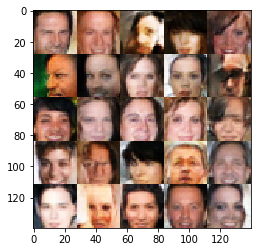

Epoch 8/8... steps:11120  Discriminator Loss: 1.1804... Generator Loss: 0.7162
Epoch 8/8... steps:11140  Discriminator Loss: 1.0203... Generator Loss: 1.2945
Epoch 8/8... steps:11160  Discriminator Loss: 1.1372... Generator Loss: 1.1326
Epoch 8/8... steps:11180  Discriminator Loss: 1.1507... Generator Loss: 0.7691
Epoch 8/8... steps:11200  Discriminator Loss: 1.2480... Generator Loss: 0.7984


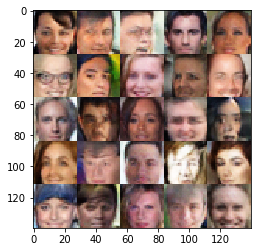

Epoch 8/8... steps:11220  Discriminator Loss: 1.2897... Generator Loss: 0.6279
Epoch 8/8... steps:11240  Discriminator Loss: 1.1312... Generator Loss: 0.9148
Epoch 8/8... steps:11260  Discriminator Loss: 1.2244... Generator Loss: 0.7090
Epoch 8/8... steps:11280  Discriminator Loss: 1.1299... Generator Loss: 0.8510
Epoch 8/8... steps:11300  Discriminator Loss: 1.2564... Generator Loss: 0.6798


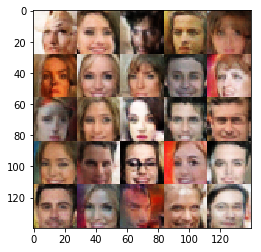

Epoch 8/8... steps:11320  Discriminator Loss: 0.9948... Generator Loss: 1.1362
Epoch 8/8... steps:11340  Discriminator Loss: 1.2022... Generator Loss: 0.7190
Epoch 8/8... steps:11360  Discriminator Loss: 1.1878... Generator Loss: 1.9190
Epoch 8/8... steps:11380  Discriminator Loss: 1.1008... Generator Loss: 1.3616
Epoch 8/8... steps:11400  Discriminator Loss: 1.0537... Generator Loss: 1.1756


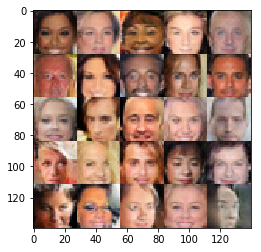

Epoch 8/8... steps:11420  Discriminator Loss: 1.0744... Generator Loss: 0.8504
Epoch 8/8... steps:11440  Discriminator Loss: 1.1653... Generator Loss: 0.7104
Epoch 8/8... steps:11460  Discriminator Loss: 1.3209... Generator Loss: 0.5536
Epoch 8/8... steps:11480  Discriminator Loss: 1.1529... Generator Loss: 0.7943
Epoch 8/8... steps:11500  Discriminator Loss: 1.1555... Generator Loss: 0.9322


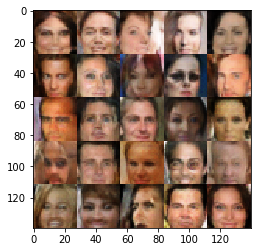

Epoch 8/8... steps:11520  Discriminator Loss: 1.1310... Generator Loss: 0.9756
Epoch 8/8... steps:11540  Discriminator Loss: 1.3707... Generator Loss: 0.5643
Epoch 8/8... steps:11560  Discriminator Loss: 1.0339... Generator Loss: 0.9933
Epoch 8/8... steps:11580  Discriminator Loss: 1.1417... Generator Loss: 0.7145
Epoch 8/8... steps:11600  Discriminator Loss: 1.0698... Generator Loss: 0.8587


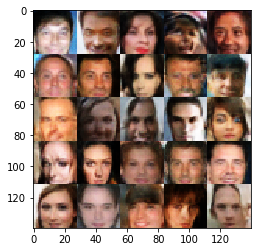

Epoch 8/8... steps:11620  Discriminator Loss: 1.3720... Generator Loss: 0.5446
Epoch 8/8... steps:11640  Discriminator Loss: 1.4191... Generator Loss: 0.4723
Epoch 8/8... steps:11660  Discriminator Loss: 1.2960... Generator Loss: 0.5936
Epoch 8/8... steps:11680  Discriminator Loss: 1.0917... Generator Loss: 0.8866
Epoch 8/8... steps:11700  Discriminator Loss: 1.2152... Generator Loss: 0.9114


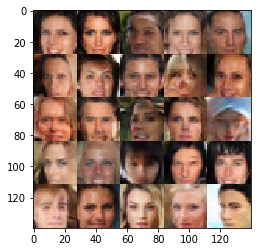

Epoch 8/8... steps:11720  Discriminator Loss: 1.3112... Generator Loss: 0.6428
Epoch 8/8... steps:11740  Discriminator Loss: 1.0528... Generator Loss: 0.9437
Epoch 8/8... steps:11760  Discriminator Loss: 0.9656... Generator Loss: 3.3900
Epoch 8/8... steps:11780  Discriminator Loss: 0.9601... Generator Loss: 2.3846
Epoch 8/8... steps:11800  Discriminator Loss: 1.1927... Generator Loss: 0.7416


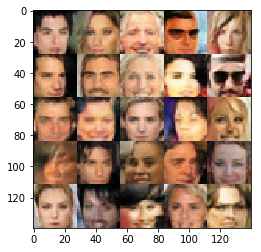

Epoch 8/8... steps:11820  Discriminator Loss: 0.9308... Generator Loss: 1.6905
Epoch 8/8... steps:11840  Discriminator Loss: 1.1005... Generator Loss: 1.3989
Epoch 8/8... steps:11860  Discriminator Loss: 1.1490... Generator Loss: 0.7306
Epoch 8/8... steps:11880  Discriminator Loss: 1.1397... Generator Loss: 0.8540
Epoch 8/8... steps:11900  Discriminator Loss: 1.2804... Generator Loss: 0.7147


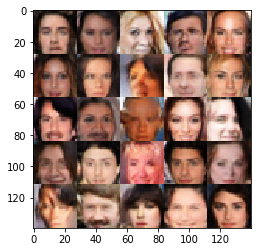

Epoch 8/8... steps:11920  Discriminator Loss: 1.0265... Generator Loss: 0.9839
Epoch 8/8... steps:11940  Discriminator Loss: 1.2723... Generator Loss: 0.6990
Epoch 8/8... steps:11960  Discriminator Loss: 1.3174... Generator Loss: 0.6163
Epoch 8/8... steps:11980  Discriminator Loss: 1.1718... Generator Loss: 0.7418
Epoch 8/8... steps:12000  Discriminator Loss: 1.0085... Generator Loss: 1.0616


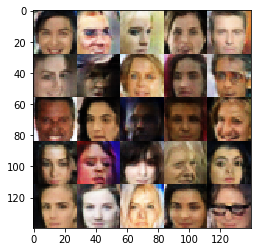

Epoch 8/8... steps:12020  Discriminator Loss: 1.0335... Generator Loss: 1.3614
Epoch 8/8... steps:12040  Discriminator Loss: 1.3083... Generator Loss: 0.6414
Epoch 8/8... steps:12060  Discriminator Loss: 1.1802... Generator Loss: 0.8852
Epoch 8/8... steps:12080  Discriminator Loss: 1.2183... Generator Loss: 0.8117
Epoch 8/8... steps:12100  Discriminator Loss: 1.0636... Generator Loss: 0.9507


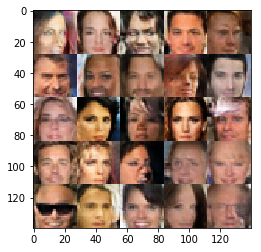

Epoch 8/8... steps:12120  Discriminator Loss: 1.0511... Generator Loss: 1.1133
Epoch 8/8... steps:12140  Discriminator Loss: 1.0853... Generator Loss: 1.0626
Epoch 8/8... steps:12160  Discriminator Loss: 1.1517... Generator Loss: 0.7683
Epoch 8/8... steps:12180  Discriminator Loss: 1.2123... Generator Loss: 0.7822
Epoch 8/8... steps:12200  Discriminator Loss: 1.0649... Generator Loss: 1.0619


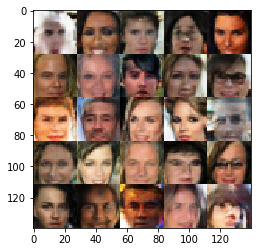

Epoch 8/8... steps:12220  Discriminator Loss: 1.1418... Generator Loss: 1.4030
Epoch 8/8... steps:12240  Discriminator Loss: 1.1431... Generator Loss: 1.2832
Epoch 8/8... steps:12260  Discriminator Loss: 1.3166... Generator Loss: 0.6353
Epoch 8/8... steps:12280  Discriminator Loss: 1.1687... Generator Loss: 0.7302
Epoch 8/8... steps:12300  Discriminator Loss: 1.0226... Generator Loss: 1.0412


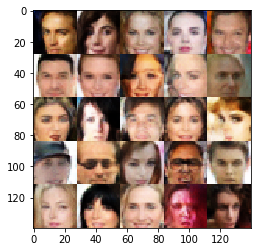

Epoch 8/8... steps:12320  Discriminator Loss: 1.2242... Generator Loss: 0.6942
Epoch 8/8... steps:12340  Discriminator Loss: 1.4918... Generator Loss: 0.4973
Epoch 8/8... steps:12360  Discriminator Loss: 1.2652... Generator Loss: 1.0969
Epoch 8/8... steps:12380  Discriminator Loss: 1.2679... Generator Loss: 0.5954
Epoch 8/8... steps:12400  Discriminator Loss: 0.9746... Generator Loss: 1.2573


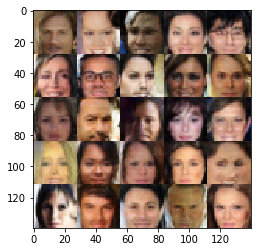

Epoch 8/8... steps:12420  Discriminator Loss: 1.0956... Generator Loss: 1.3019
Epoch 8/8... steps:12440  Discriminator Loss: 1.1547... Generator Loss: 1.4665
Epoch 8/8... steps:12460  Discriminator Loss: 1.3573... Generator Loss: 1.9870
Epoch 8/8... steps:12480  Discriminator Loss: 0.9563... Generator Loss: 1.0811
Epoch 8/8... steps:12500  Discriminator Loss: 1.0008... Generator Loss: 1.2116


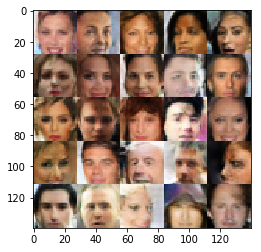

Epoch 8/8... steps:12520  Discriminator Loss: 1.3343... Generator Loss: 0.5996
Epoch 8/8... steps:12540  Discriminator Loss: 1.2364... Generator Loss: 0.6965
Epoch 8/8... steps:12560  Discriminator Loss: 1.3789... Generator Loss: 0.5715
Epoch 8/8... steps:12580  Discriminator Loss: 1.1422... Generator Loss: 0.8806
Epoch 8/8... steps:12600  Discriminator Loss: 1.1233... Generator Loss: 0.9717


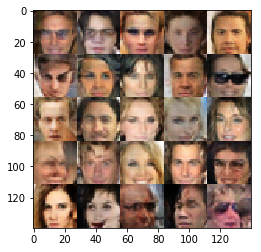

Epoch 8/8... steps:12620  Discriminator Loss: 1.0078... Generator Loss: 1.0000
Epoch 8/8... steps:12640  Discriminator Loss: 0.9546... Generator Loss: 1.1763
final Discriminator Loss: 0.9546... Generator Loss: 1.1763


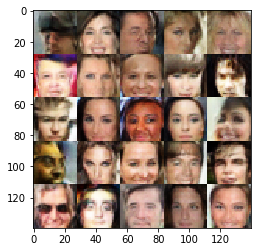

In [12]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。